# Procesamiento de señales de audio mediante convolución

Estudiante: Christian Daniel Loja Chalco

En este archivo se realizará una serie de actividades o ejemplos de la aplicación de la operación de convolución para el tratamiento de señales de audio. En específico se aplicarán filtros pasa altos, pasa bajos, pasa banda y un par de efectos de reverberación.

Para facilitar el trabajo se han implementado una serie de librerias que contienen herramientas dirigidas al tratamiento y visualización de señales. La operación de convolucíon se realizará mediante la aplicación de la librería Numpy, mientras que, los kernel de convolución o filtros h[n] se diseñarán mediante la herramienta "firwin" de la libreria scipy.

In [2]:
# Librerias usadas
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
from scipy.signal import firwin, freqz, spectrogram
from glob import glob

# Cargar la ubicación de la señal de audio de entrada
audio_file = glob('C:/Users/Christian/Documents/U_Cuenca/Sistemas L y Señales/Trabajo_Convolucion/ambient-piano.mp3')

In [3]:
# Cargar el archivo de audio en un array "audio" y extraer su sample rate en una variable "sr"
audio_in, sr = librosa.load(audio_file[0])

print(f'Datos audio de entrada: {audio_in[:10]}') # Primeros 10 datos de la señal de audio
print(f'Shape audio de entrada: {audio_in.shape}') # Tamaño del array de la señal de audio
print(f'Sample Rate: {sr}') # Sample rate de la señal de audio

Datos audio de entrada: [-6.8212103e-13 -4.5474735e-13  4.8316906e-13  1.5916157e-12
 -3.9790393e-13  2.7284841e-12 -6.8212103e-13 -1.0231815e-12
 -2.7284841e-12 -9.6633812e-13]
Shape audio de entrada: (232128,)
Sample Rate: 22050


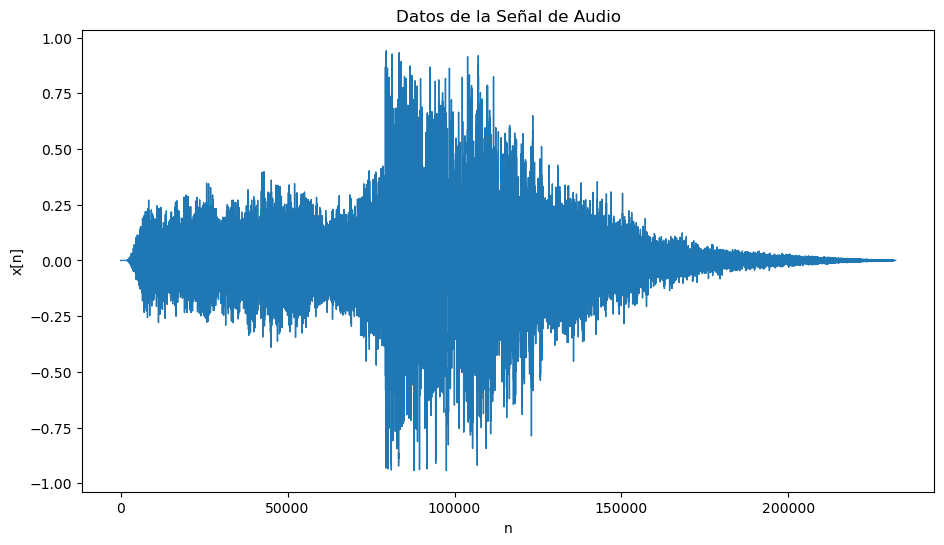

Text(0.5, 1.0, 'Frecuencias de la Señal de Audio')

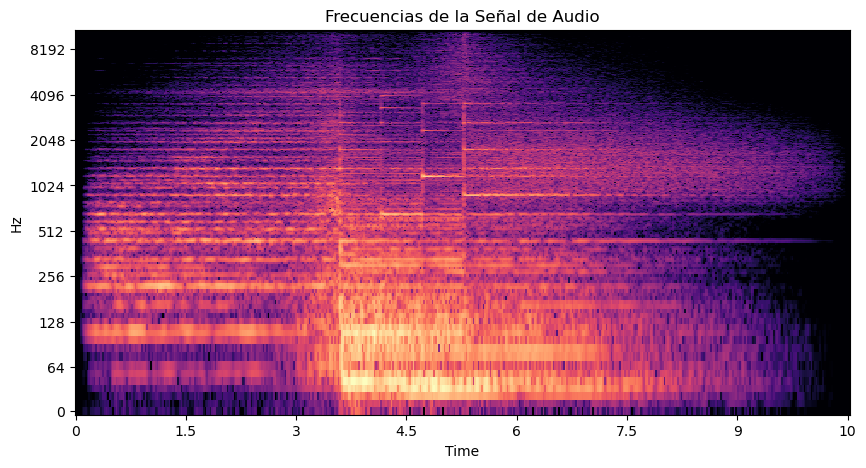

In [4]:
# Graficar datos en el tiempo de la señal de audio
pd.Series(audio_in).plot(figsize=(11, 6), lw=1, title='Datos de la Señal de Audio')
plt.xlabel('n')
plt.ylabel('x[n]')
plt.show()

# Graficar el espectro de frecuencias de la señal de audio
TF_audio = librosa.stft(audio_in)
Amp_audio_db = librosa.amplitude_to_db(abs(TF_audio), ref=np.max)
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_audio_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal de Audio')

In [5]:
ipd.Audio(audio_file[0]) # Reproducir el audio cargado

En las gráficas presentadas anteriormente se muestran las características originales de la señal de audio. En el reproductor
de audio generado en la línea de código anterior se puede escuchar el audio original.

## Filtros básicos para el suavizado de señales

1. Este primer filtro consta de un kernel con dos términos h[n]=[1, -1] que detecta cambios rápidos entre un par de datos y los
diferencia. Esto aplicado a toda la señal de audio produce una especie de suavizado que remarca ligeramente los cambios rápidos en frecuencia.

In [6]:
# Kernel o filtro de suavizado
kernel_f1 = np.array([1, -1]) #Kernel
filtro_1 = np.convolve(audio_in, kernel_f1, mode='same') #Convolución entre el audio y kernel

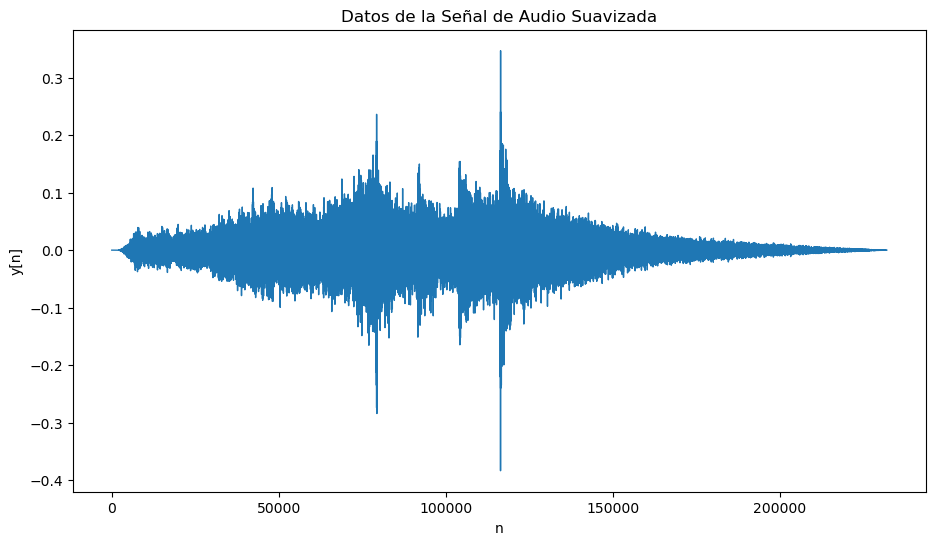

Text(0.5, 1.0, 'Frecuencias de la Señal Filtrada')

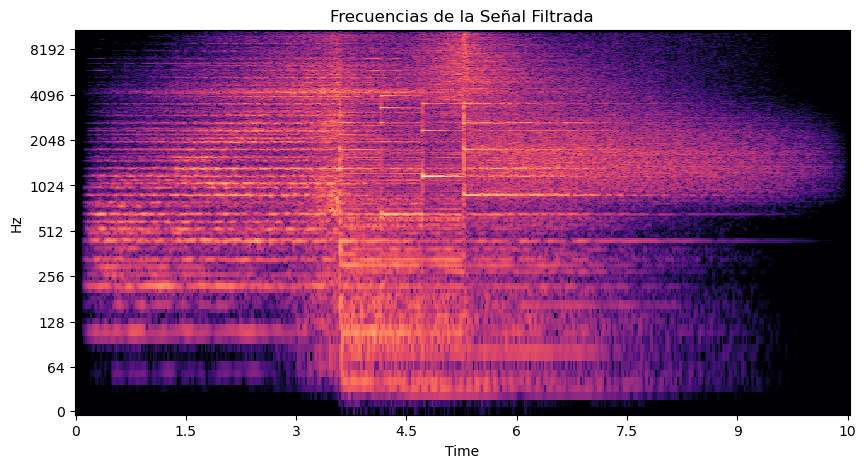

In [8]:
# Grafica del resultado de la convolución
pd.Series(filtro_1).plot(figsize=(11, 6), lw=1, title='Datos de la Señal de Audio Suavizada')
plt.xlabel('n')
plt.ylabel('y[n]')
plt.show()

# Graficar el espectro de frecuencias de la señal de audio
TF_filtro1 = librosa.stft(filtro_1)
Amp_filtro1_db = librosa.amplitude_to_db(abs(TF_filtro1), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_filtro1_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal Filtrada')

In [9]:
filtro_1 /= np.max(np.abs(filtro_1)) #Normalizar el resultado para evitar saturación en el audio
ipd.Audio(filtro_1, rate=sr) #Reproducir el audio resultante

Como se aprecia en el audio resultante la señal de audio obtenida se escucha mucho más uniforme, las frecuencias que componen
el audio ya no presentan cambios tan notorios como en la señal original. Este filtro también se conoce como filtro de diferenciación simple.

2. Este segundo filtro consta de un kernel con tres términos h[n]=[1, -2, 1] que funciona de forma similar al kernel de convolución anterior pero, en este caso, el valor de -2 ubicado en el medio aumenta el suavizado y, además, elimina parte de las frecuencias bajas de la señal de audio.

In [10]:
#Kernel o filtro básico de frecuencias bajas
kernel_f2 = np.array([1, -2, 1]) #Kernel
filtro_2 = np.convolve(audio_in, kernel_f2, mode='same') #Convolución entre el audio y kernel

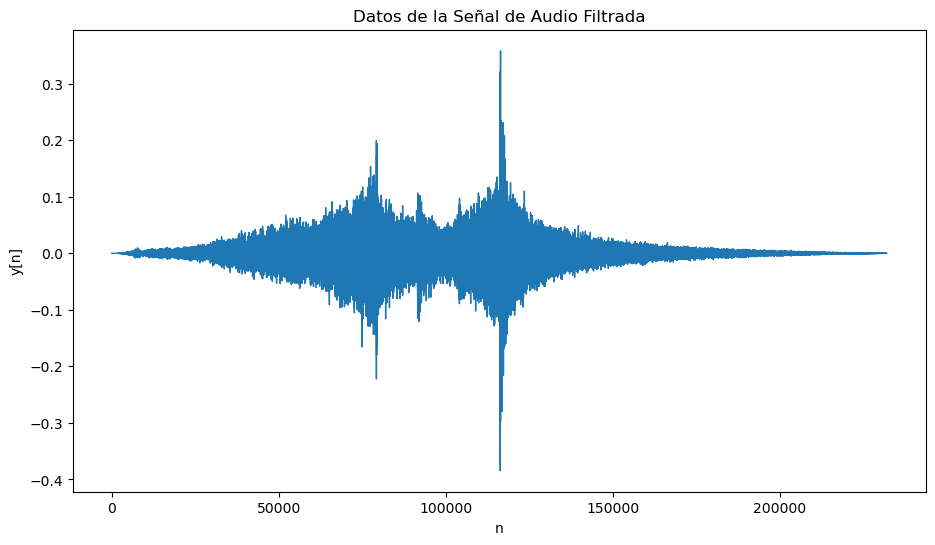

Text(0.5, 1.0, 'Frecuencias de la Señal Filtrada')

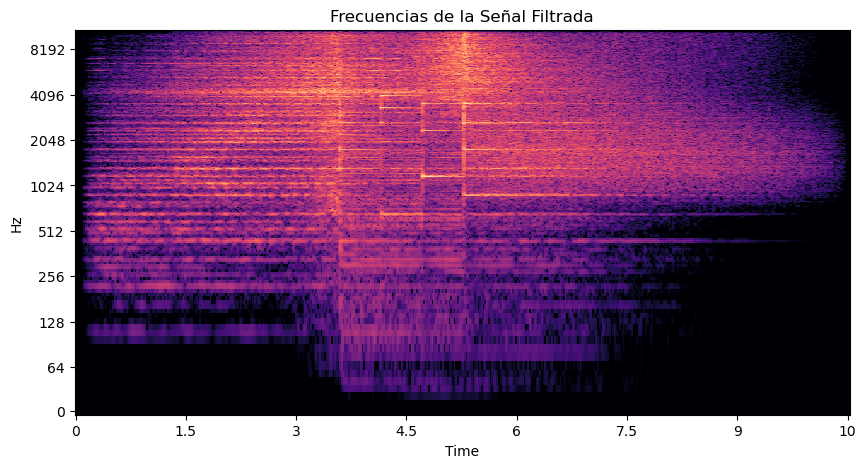

In [11]:
#Grafica del resultado de la convolución
pd.Series(filtro_2).plot(figsize=(11, 6), lw=1, title='Datos de la Señal de Audio Filtrada')
plt.xlabel('n')
plt.ylabel('y[n]')
plt.show()

# Graficar el espectro de frecuencias de la señal de audio resultante
TF_filtro2 = librosa.stft(filtro_2)
Amp_filtro2_db = librosa.amplitude_to_db(abs(TF_filtro2), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_filtro2_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal Filtrada')

In [12]:
filtro_2 /= np.max(np.abs(filtro_2)) #Normalizar el resultado para evitar saturación en el audio
ipd.Audio(filtro_2, rate=sr) #Reproducir el audio resultante

El suavizado obtenido con este filtro es mucho más apreciable que en el caso anterior. Este filtro también se conoce como filtro de diferenciación doble. En el espectrograma se ve que las frecuencias entre 0 y 256 Hz han sido reducidas.

3. Este tercer filtro consta de un kernel con tres términos h[n]=[-1, 0, 1] que funciona de forma muy parecida al primer filtro. El suavizado en este caso es un poco más apreciable ya que el kernel o el filtro abarca más valores.

In [13]:
kernel_f3 = np.array([-1, 0, 1]) #Kernel
filtro_3 = np.convolve(audio_in, kernel_f3, mode='same') #Convolución entre el audio y kernel

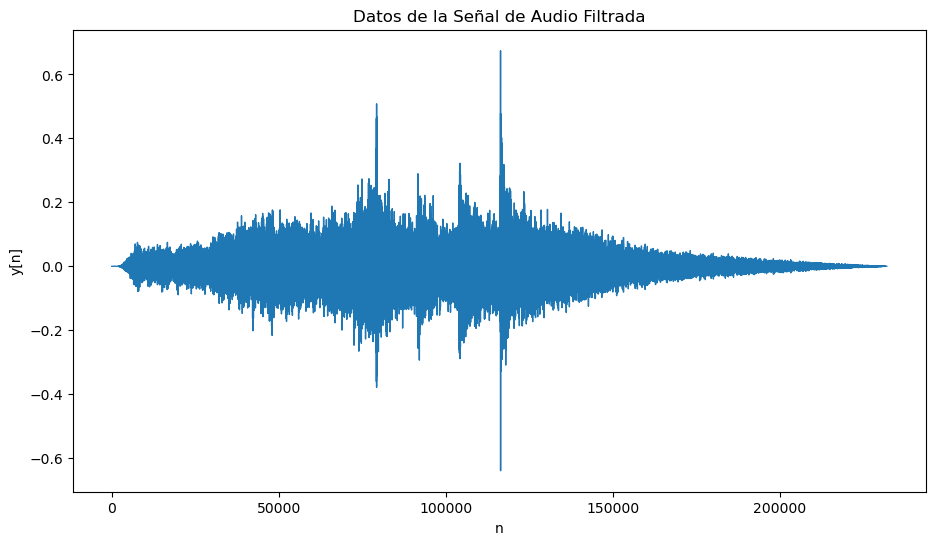

Text(0.5, 1.0, 'Frecuencias de la Señal Filtrada')

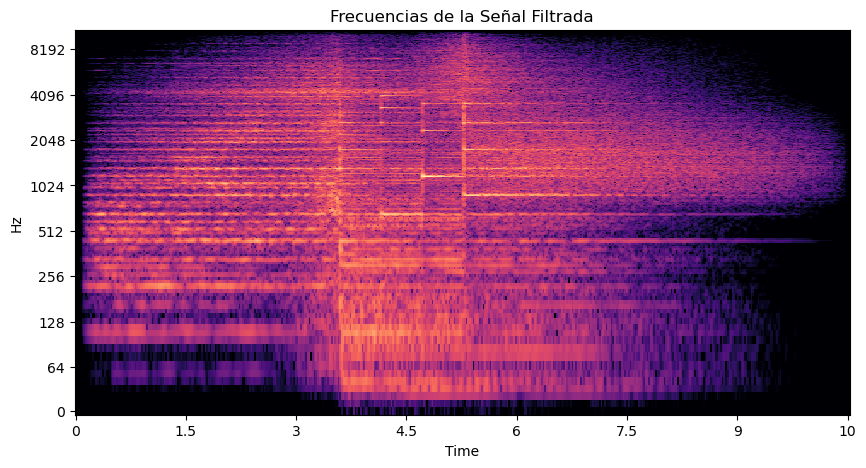

In [15]:
# Gráfica del audio filtrado
pd.Series(filtro_3).plot(figsize=(11, 6), lw=1, title='Datos de la Señal de Audio Filtrada')
plt.xlabel('n')
plt.ylabel('y[n]')
plt.show()

# Graficar el espectro de frecuencias de la señal de audio resultante
TF_filtro3 = librosa.stft(filtro_3)
Amp_filtro3_db = librosa.amplitude_to_db(abs(TF_filtro3), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_filtro3_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal Filtrada')

In [16]:
ipd.Audio(filtro_3, rate=sr) #Reproducir el audio resultante con el filtro Sobel

4. Este cuarto filtro consta de un kernel con tres términos h[n]=[-1/3, -1/3, -1/3] o h[n]=[-1, -1, -1]/3 que se conoce como un filtro de media suavizado, ya que, toma tres valores de la señal y los promedia. Este filtro genera una señal resultante menos suave que con los filtros anteriores pero con mayor fidelidad al audio original.

In [19]:
kernel_f4 = np.array([-1, -1, -1]) / 3 #Kernel
filtro_4 = np.convolve(audio_in ,kernel_f4, mode='same') #Convolución entre el audio y kernel

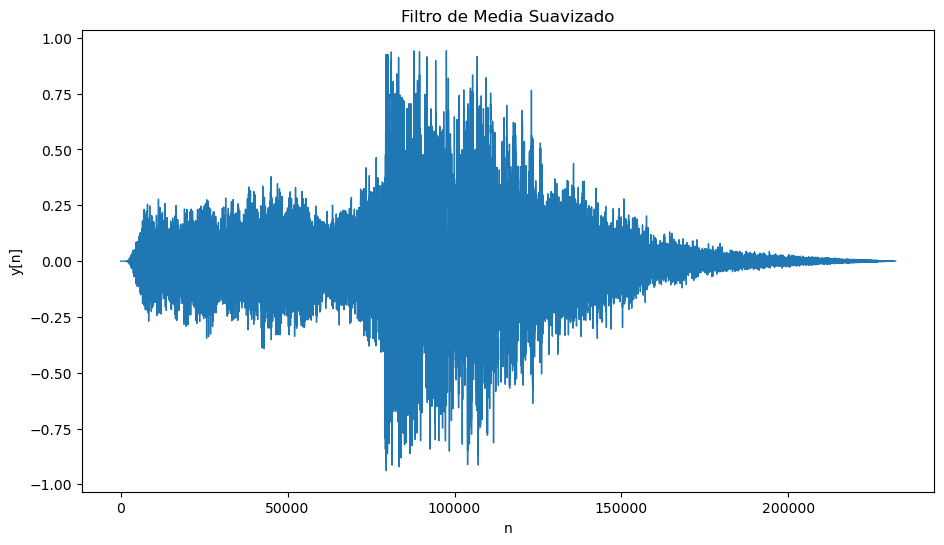

Text(0.5, 1.0, 'Frecuencias de la Señal (Filtro de Media Suavizado)')

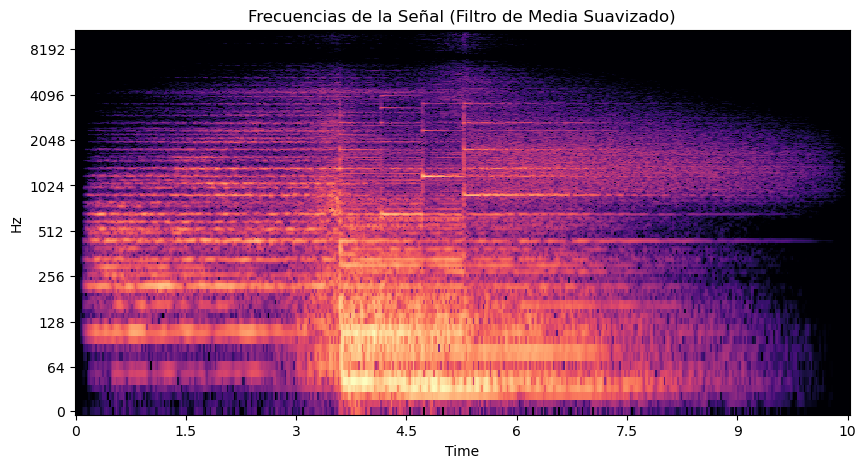

In [21]:
# Gráfica del audio filtrado
pd.Series(filtro_4).plot(figsize=(11, 6), lw=1, title='Filtro de Media Suavizado')
plt.xlabel('n')
plt.ylabel('y[n]')
plt.show()

# Graficar el espectro de frecuencias de la señal de audio resultante
TF_filtro4 = librosa.stft(filtro_4)
Amp_filtro4_db = librosa.amplitude_to_db(abs(TF_filtro4), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_filtro4_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal (Filtro de Media Suavizado)')

In [22]:
ipd.Audio(filtro_4, rate=sr) #Reproducir el audio resultante

Los filtros usados en este apartado son la versión en una dimensión de filtros en dos dimensiones usados en imagenes para detectar bordes, suavizar o desenfocar. En los apartados siguientes se planterán filtros, kernels o respuestas h[n] que servirán específicamente para señales de audio.

## Efecto de Reverberación 

El efecto de reverberación se obtiene al mezclar dos señales (mediante convolución) de audio y obtener una sola con las características de ambás señales. La primera señal necesaria corresponde al audio que se quiere modificar, por otro lado, la segunda señal es la respuesta al impulso obtenida por grabaciones en un espacio que genere reverberación por si solo.

1. La primera respuesta al impulso que se usará corresponde a una señal que comienza en 1 y va decayendo lentamente hacia cero.

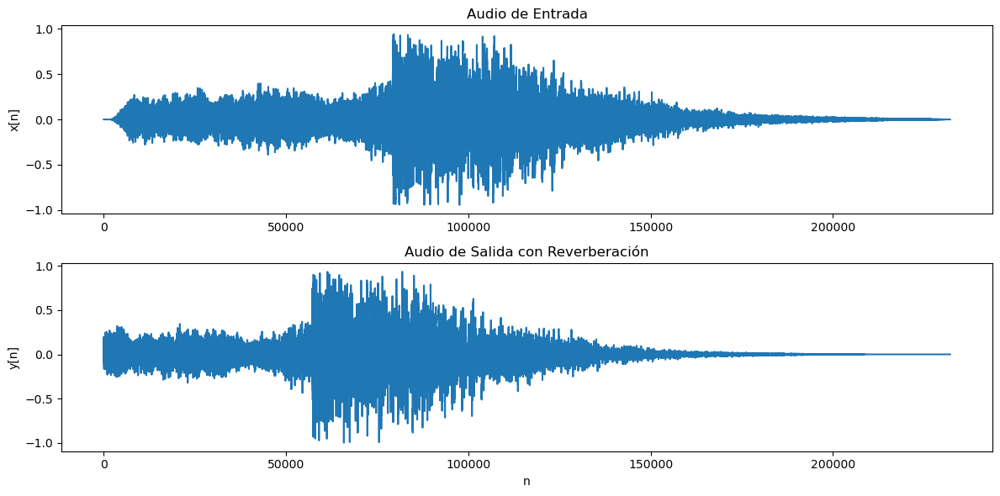

In [23]:
cant_coef = 44100  # Cantidad de términos en h[n]

h_rev = np.zeros(cant_coef)

h_rev[0] = 1.0  # Valor inicial o en h[n]=0
atenuar = 0.8  # Factor de atenuación de la reverberación

for i in range(1, cant_coef):
    h_rev[i] = atenuar * h_rev[i - 1]

# Convolución entre el audio de entrada y la respuesta al impulso
reverb = np.convolve(audio_in, h_rev, mode='same')

# Normalizar la señal de salida para evitar saturación
reverb /= np.max(np.abs(reverb))

# Graficar la señal de entrada
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(audio_in)
plt.ylabel('x[n]')
plt.title('Audio de Entrada')

# Graficar la salida con reverberación
plt.subplot(2, 1, 2)
plt.plot(reverb)
plt.title('Audio de Salida con Reverberación')
plt.xlabel('n')
plt.ylabel('y[n]')
plt.tight_layout()
plt.show()

En la gráfica de las señales de audio se aprecia cómo el efecto de reverberación refuerza los datos al inicio de la señal y los va atenuando conforme avanza en el tiempo. Esta característica ha sido aportada por la respuesta al impulso.

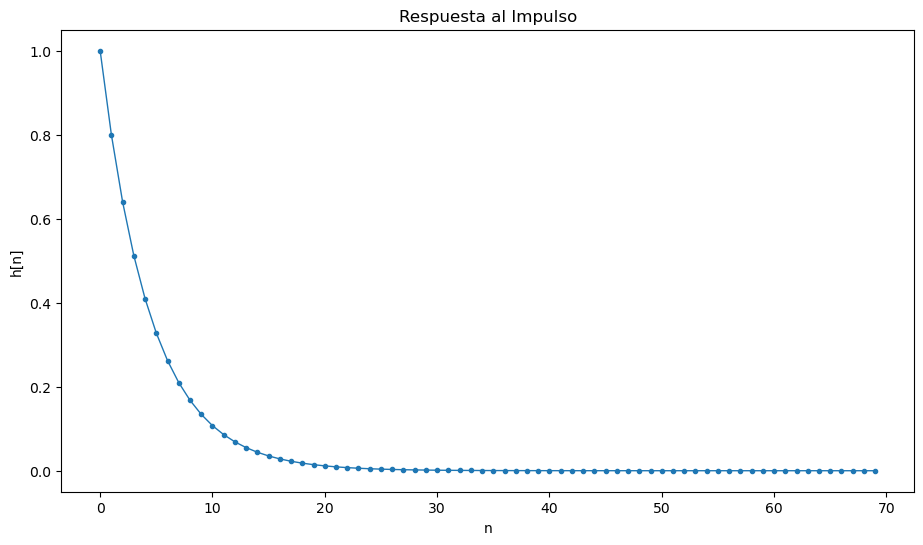

In [26]:
# Gráfica del Kernel
pd.Series(h_rev[0:70]).plot(figsize=(11, 6), lw=1, marker='.', title='Respuesta al Impulso')
plt.xlabel('n')
plt.ylabel('h[n]')
plt.show()

Text(0.5, 1.0, 'Frecuencias de la Señal de Audio con Reverb')

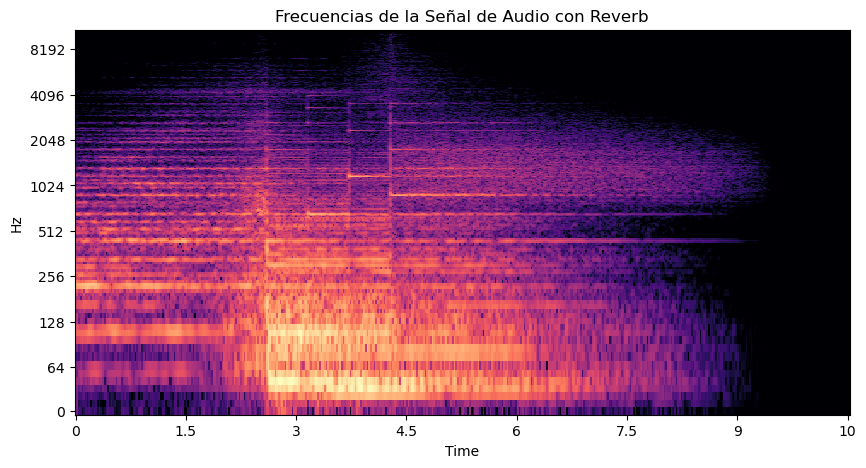

In [27]:
# Transformada de Fourier del audio con reverberación
TF_rev = librosa.stft(reverb)
Amp_reverb_db = librosa.amplitude_to_db(abs(TF_rev), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_reverb_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal de Audio con Reverb')

In [28]:
ipd.Audio(reverb, rate=sr) #Reproducir el audio resultante con reverberación

Para comparar el audio resultante con el original, a continuación, se incluye nuevamente la información sobre la señal original:

Text(0.5, 1.0, 'Frecuencias de la Señal de Audio Original')

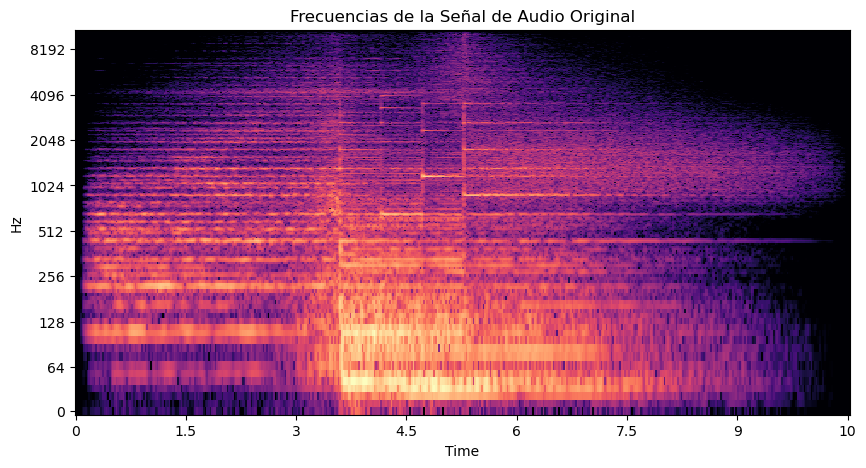

In [29]:
# Graficar el espectro de frecuencias de la señal de audio original
TF_audio = librosa.stft(audio_in)
Amp_audio_db = librosa.amplitude_to_db(abs(TF_audio), ref=np.max)
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_audio_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal de Audio Original')

In [30]:
ipd.Audio(audio_file[0]) # Reproducir el audio original

Al comparar los espectrogramas de la señal de audio original con el del audio con reverb se ve que son bastante similares, las diferencias residen en cómo se distribuye la cantidad de frecuencias en el tiempo.

2. El efecto de reverberación también se puede aproximar a partir de la expresión de respuesta al impulso h[n]=sin(Wo*n)/πn que corresponde a un filtro paso bajo digital ideal o "brick wall" truncado. La frecuencia Wo es la frecuencia de corte, con la variación de los valores de n en un intervalo cerrado se obtiene un filtro FIR (Finite Impulse Response).

h[n]= [-1.39019618e-13 -5.58323474e-14 -3.55180480e-13 -2.73052493e-13
 -1.87353724e-13 -9.78461204e-14 -4.26998953e-15 -3.37226920e-13
 -2.44894326e-13 -1.48057703e-13]


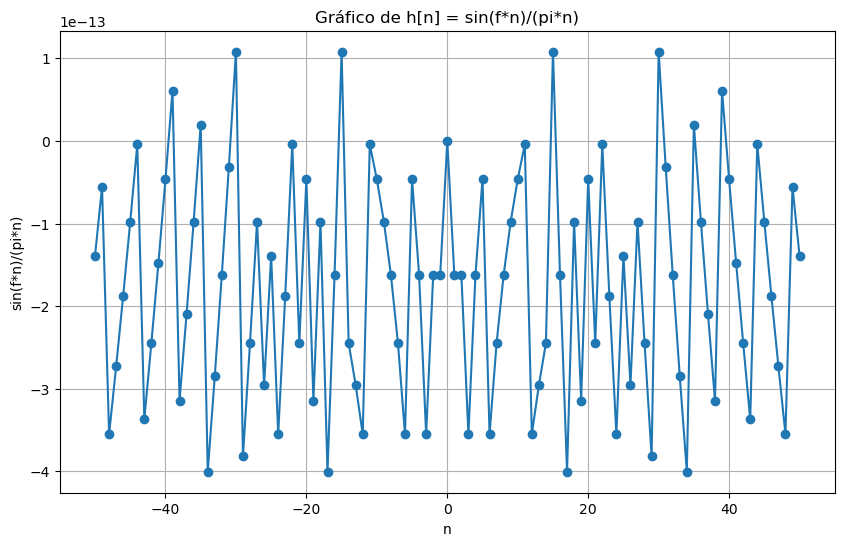

In [31]:
fc = 1500*2*np.pi # Frecuencia de corte en rad/s

# Crear un array de valores enteros desde -50 a 50
n_1 = np.arange(-50, 0)
n_2 = np.arange(1, 51)

# Calcular los valores de la función sin(f*n)/(pi*n)
interv_1 = np.sin(fc * n_1) / (np.pi * n_1)
interv_2 = np.sin(fc * n_2) / (np.pi * n_2)

# Ordenar los valores de la respuesta al impulso
h_n = np.concatenate((interv_1, [0], interv_2), axis=None)

print(f'h[n]= {h_n[:10]}') # Primeros 10 valores de h[n]

valores = np.concatenate((n_1, [0], n_2), axis=None)

# Graficar los valores de h[n]
plt.plot(valores, h_n, marker='o', linestyle='-')
plt.title('Gráfico de h[n] = sin(f*n)/(pi*n)')
plt.xlabel('n')
plt.ylabel('sin(f*n)/(pi*n)')
plt.grid(True)
plt.show()

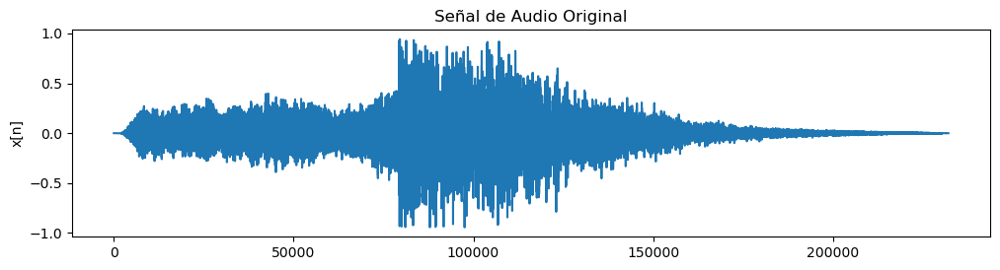

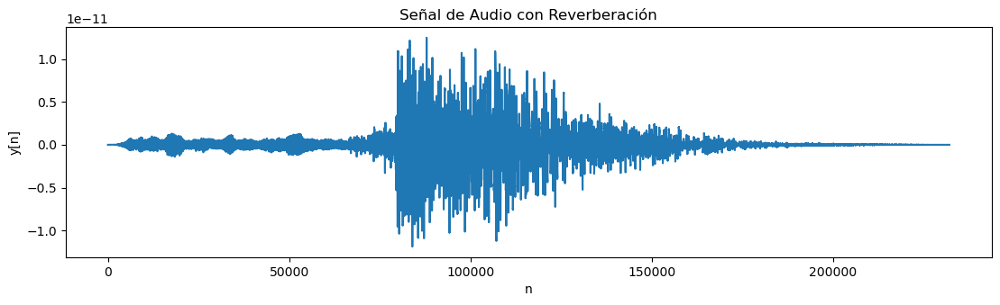

In [33]:
out_PB_brick = np.convolve(audio_in, h_n, mode='same') #Convolución entre el audio y h[n]

# Graficar la señal de entrada
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(audio_in)
plt.ylabel('x[n]')
plt.title('Señal de Audio Original')

# Graficar la señal filtrada
plt.figure(figsize=(11, 6))
plt.subplot(2, 1, 2)
plt.plot(out_PB_brick)
plt.title('Señal de Audio con Reverberación')
plt.tight_layout()
plt.xlabel('n')
plt.ylabel('y[n]')
plt.show()

In [34]:
ipd.Audio(out_PB_brick, rate=sr) #Reproducir el audio resultante con reverberación

In [35]:
ipd.Audio(audio_file[0]) # Reproducir el audio original

## Aplicación de filtros (Pasa Banda, Pasa Bajos, Pasa Altos)

Para obtener los valores de las respuestas al impulso necesarias en la aplicación de cada filtro se utilizará la herramienta firwin (generadora de filtros FIR) de la librería Scipy. Esta función necesita un conjunto de datos sobre la señal de entrada que se quiere filtrar, los cuales son: numtaps o la cantidad de coeficientes o valores que tendrá h[n], cutoff es la frecuencia de corte para el filtro, window es el método de ventanas de filtro que se aplicará (en este caso se usará Hamming en todos los filtros), pass_zero define si el filtro pasa por la frecuencia 0 y, por último, fs que hace referencia al sample rate de la señal de entrada.

Para que el filtro funcione de manera eficiente con la señal de entrada es necesario definir todos sus parámetros correctamente.

### Filtro Pasa Banda
Un filtro pasa banda es un filtro que solamente permite pasar a la salida las frecuencias que estan contenidas en un intervalo definido de frecuencias. En este caso, usando la función firwin de la libreria Scipy se generará un filtro FIR que al convolucionarlo con la señal de audio se extraerán solamente las frecuencias del audio que estén dentro del intervalo definido.

In [36]:
# Respuesta al impulso que actua como filtro pasa banda
h_banda = firwin(numtaps=1000+1, cutoff=[300, 600], window='hamming', pass_zero=False, fs=22050)

print(f'h[n]= {h_banda}') # Valores de la respuesta al impulso

h[n]= [1.68032088e-05 2.53683646e-05 3.43186342e-05 ... 3.43186342e-05
 2.53683646e-05 1.68032088e-05]


En las líneas de código anteriores se ha planteado una respuesta al impulso que funcione como filtro paso banda para frecuencias de 300 a 600Hz.

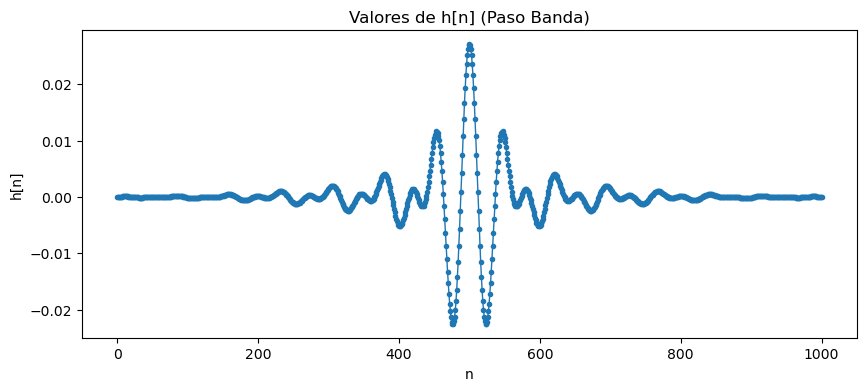

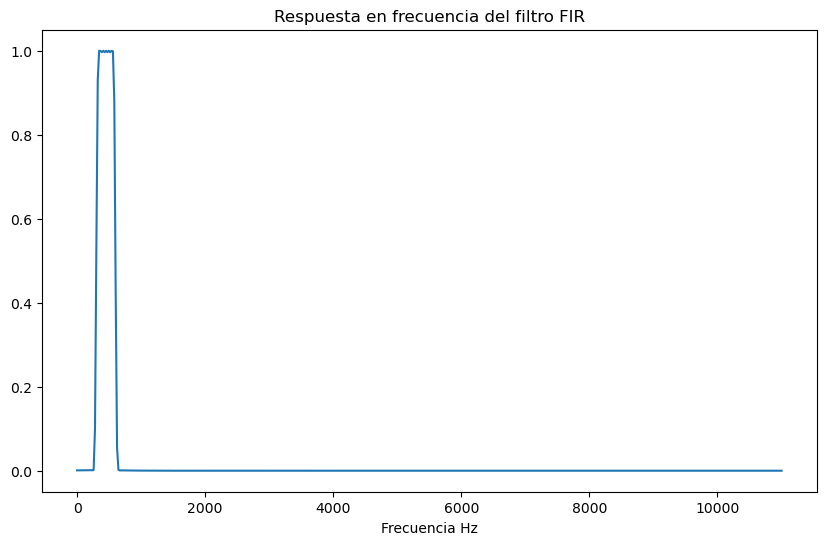

In [37]:
# Graficar h[n]
pd.Series(h_banda).plot(figsize=(10, 4), lw=1, marker='.', title='Valores de h[n] (Paso Banda)')
plt.xlabel('n')
plt.ylabel('h[n]')
plt.show()

# Graficar la respuesta en frecuencia de h[n]
a=1
w1, v1 = freqz(h_banda, fs=sr)
plt.rcParams["figure.figsize"] = (10,6)
plt.plot(w1, abs(v1))
plt.title('Respuesta en frecuencia del filtro FIR')
plt.xlabel('Frecuencia Hz')
plt.show()

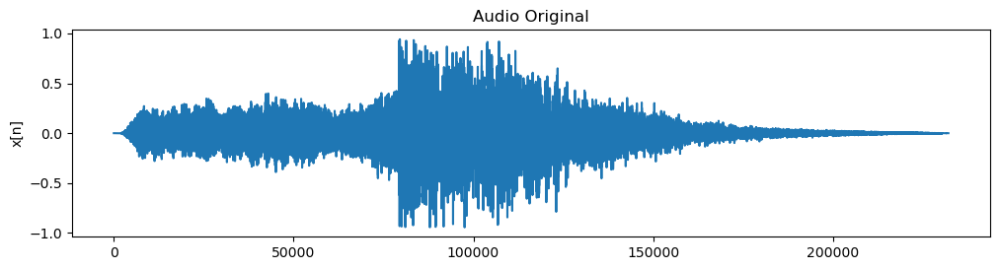

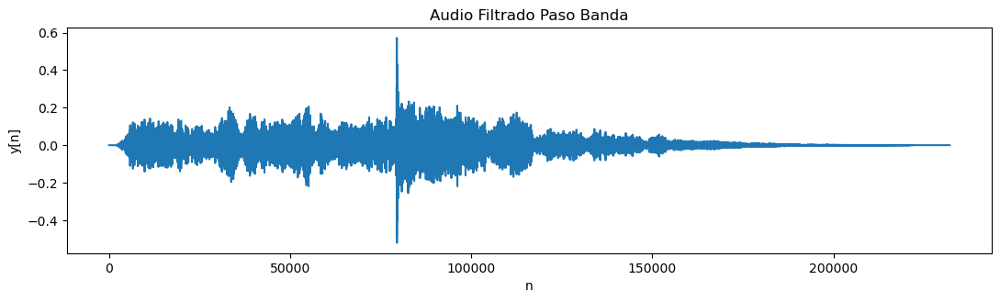

In [38]:
out_PBanda = np.convolve(audio_in, h_banda, mode='same') #Convolución entre el audio y h_banda

# Graficar la señal de entrada
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(audio_in)
plt.ylabel('x[n]')
plt.title('Audio Original')

# Graficar la señal filtrada
plt.figure(figsize=(11, 6))
plt.subplot(2, 1, 2)
plt.plot(out_PBanda)
plt.xlabel('n')
plt.ylabel('y[n]')
plt.title('Audio Filtrado Paso Banda')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Frecuencias de la Señal de Audio Filtrada (Paso Banda)')

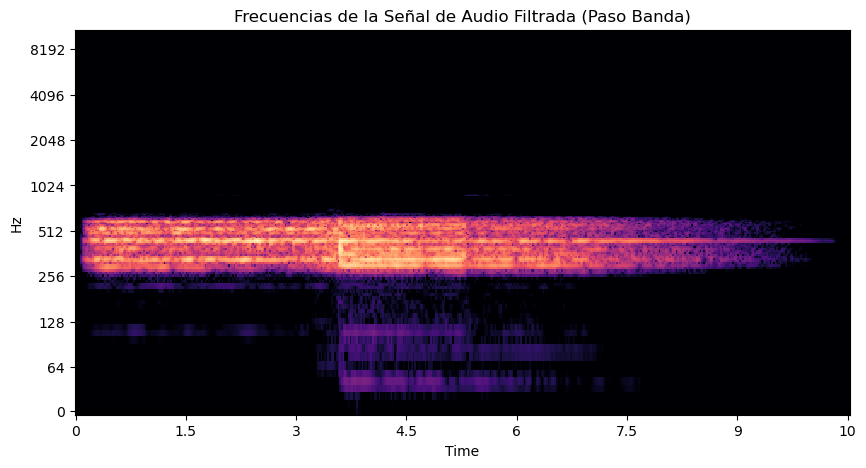

In [39]:
# Graficar el espectro de frecuencias de la señal de audio resultante
TF_banda = librosa.stft(out_PBanda)
Amp_banda_db = librosa.amplitude_to_db(abs(TF_banda), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_banda_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal de Audio Filtrada (Paso Banda)')

En el espectrograma se aprecia que las frecuencias existentes en la señal de audio resultante están entre aproximadamente 300Hz hasta los 600Hz.

In [40]:
ipd.Audio(out_PBanda, rate=sr) #Reproducir el audio resultante

### Filtro Pasa Bajo
Un filtro pasa bajo funciona de tal menera que en la salida del sistema se tienen únicamente las frecuencias que están por debajo de una frecuencia de corte definida, es decir, si se diseña un filtro pasa bajos con frecuencia de corte en 300Hz, entonces, las frecuencias que llegarán a la salida son las que están entre 0 y 300Hz.

A continuación se muestra el diseño del filtro FIR para obtener un filtro pasa bajos con frecuencia de corte de 300Hz.

In [41]:
h_bajo = firwin(numtaps=1000+1, cutoff=300, window='hamming', pass_zero=True, fs=22050)

print(f'h[n]= {h_bajo}') # Valores de la respuesta al impulso

h[n]= [-4.81800003e-05 -4.95235334e-05 -5.05217537e-05 ... -5.05217537e-05
 -4.95235334e-05 -4.81800003e-05]


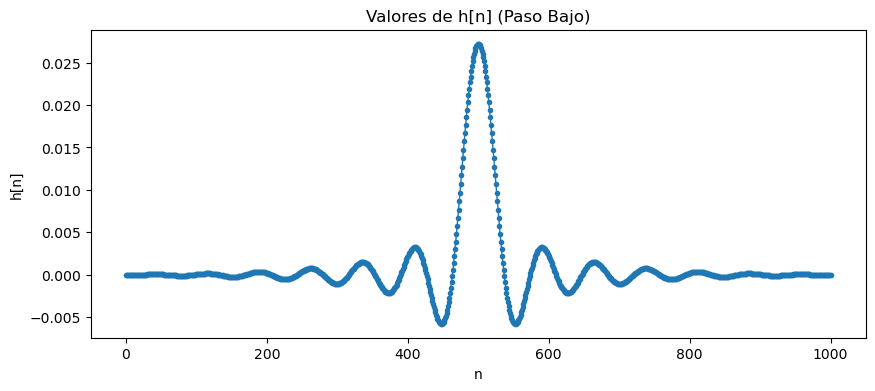

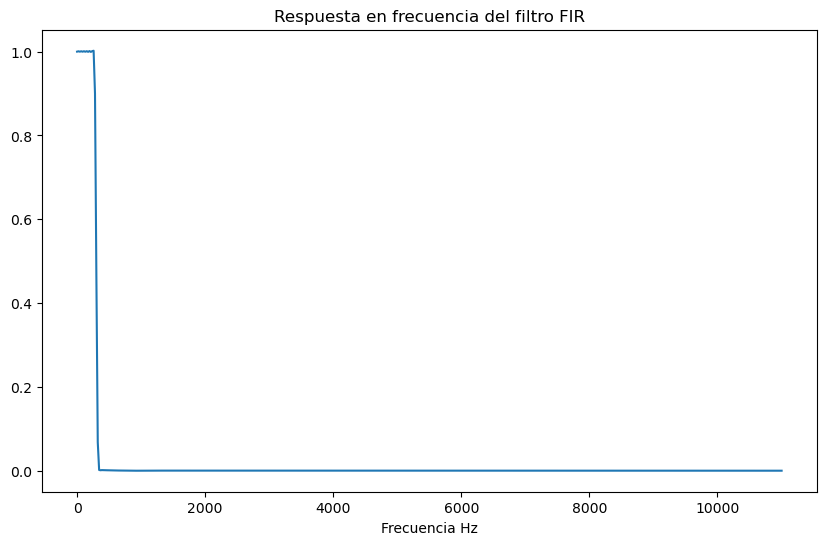

In [42]:
# Graficar h[n]
pd.Series(h_bajo).plot(figsize=(10, 4), lw=1, marker='.', title='Valores de h[n] (Paso Bajo)')
plt.xlabel('n')
plt.ylabel('h[n]')
plt.show()

# Graficar la respuesta en frecuencia de h[n]
a=1
w1, v1 = freqz(h_bajo, fs=sr)
plt.rcParams["figure.figsize"] = (10,6)
plt.plot(w1, abs(v1))
plt.xlabel('Frecuencia Hz')
plt.title('Respuesta en frecuencia del filtro FIR')
plt.show()

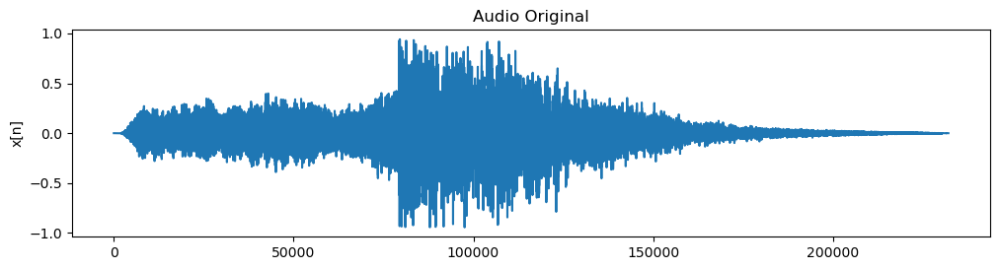

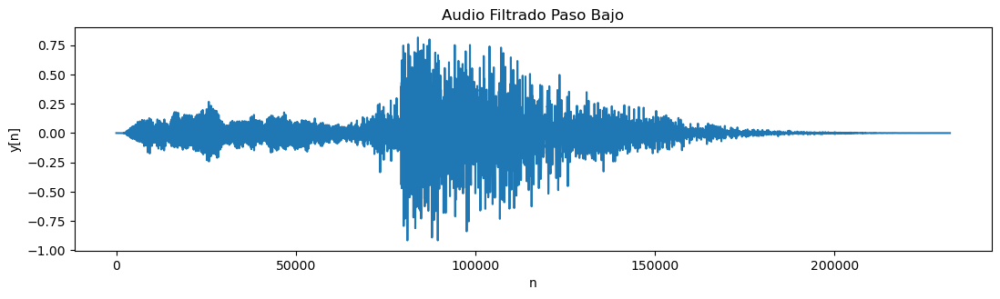

In [43]:
out_PBajo = np.convolve(audio_in, h_bajo, mode='same') #Convolución entre el audio y h_bajo

# Graficar la señal de entrada
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(audio_in)
plt.ylabel('x[n]')
plt.title('Audio Original')

# Graficar la señal filtrada
plt.figure(figsize=(11, 6))
plt.subplot(2, 1, 2)
plt.plot(out_PBajo)
plt.xlabel('n')
plt.ylabel('y[n]')
plt.title('Audio Filtrado Paso Bajo')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Frecuencias de la Señal de Audio Filtrada (Paso Bajo)')

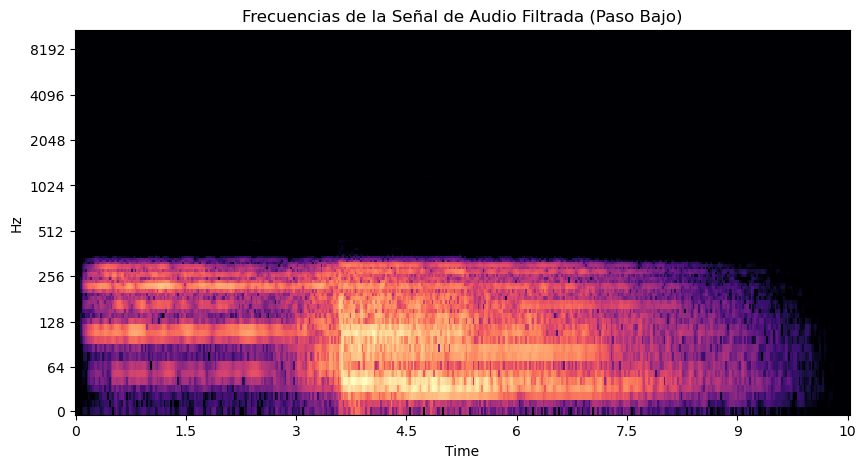

In [44]:
# Graficar el espectro de frecuencias de la señal de audio resultante
TF_bajo = librosa.stft(out_PBajo)
Amp_bajo_db = librosa.amplitude_to_db(abs(TF_bajo), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_bajo_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal de Audio Filtrada (Paso Bajo)')

En el espectrograma se ve cómo las frecuencias en la señal de salida se concentran únicamente desde los 0Hz hasta, aproximadamente, los 300Hz.

In [45]:
ipd.Audio(out_PBajo, rate=sr) #Reproducir el audio resultante

### Filtro Pasa Altos

Un filtro pasa altos permite que a la salida lleguen únicamente los componentes de frecuencias que están por encima de una frecuencia de corte definida.

A continuación, se muestra la generación de una respuesta al impulso que permitirá eliminar las frecuencias de la señal de audio de entrada que estén por debajo de los 320Hz.

In [46]:
h_alto = firwin(numtaps=1000+1, cutoff=320, window='hamming', pass_zero=False, fs=22050)

print(f'h[n]= {h_alto}') # Valores de la respuesta al impulso

h[n]= [-5.08930775e-05 -5.09710270e-05 -5.06363620e-05 ... -5.06363620e-05
 -5.09710270e-05 -5.08930775e-05]


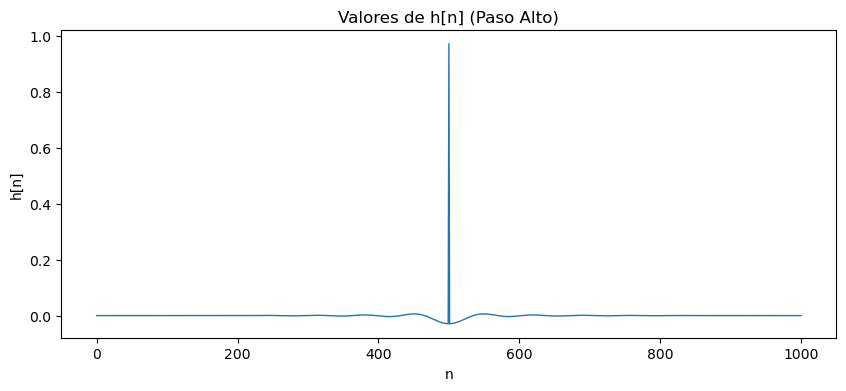

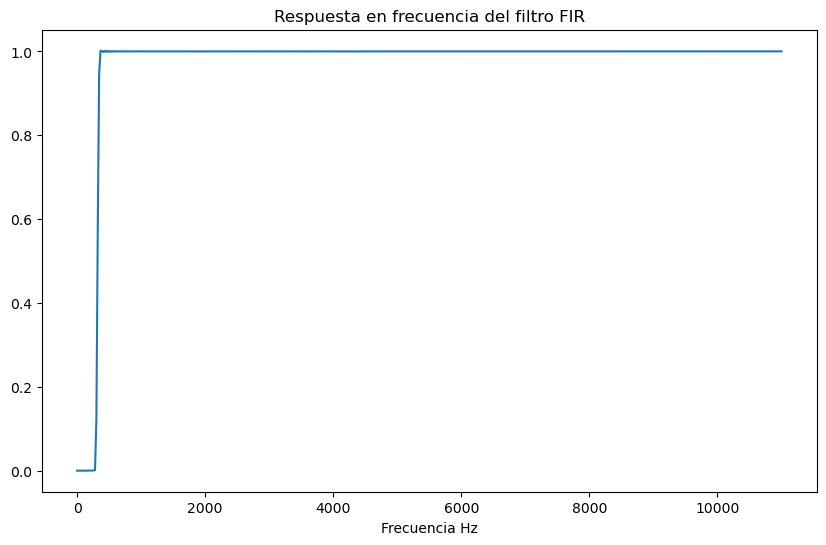

In [47]:
# Graficar h[n]
pd.Series(h_alto).plot(figsize=(10, 4), lw=1, title='Valores de h[n] (Paso Alto)')
plt.xlabel('n')
plt.ylabel('h[n]')
plt.show()

# Graficar la respuesta en frecuencia de h[n]
a=1
w1, v1 = freqz(h_alto, fs=sr)
plt.rcParams["figure.figsize"] = (10,6)
plt.plot(w1, abs(v1))
plt.title('Respuesta en frecuencia del filtro FIR')
plt.xlabel('Frecuencia Hz')
plt.show()

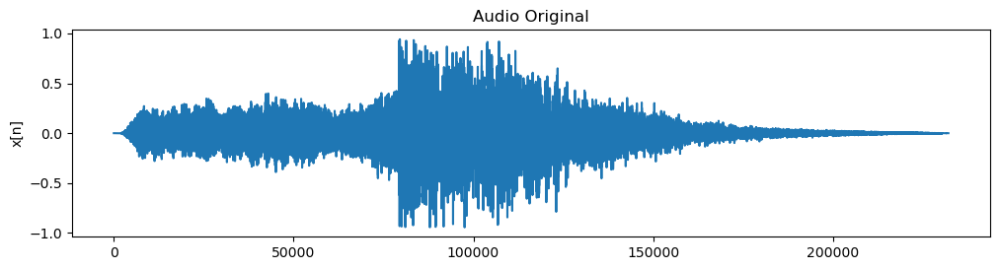

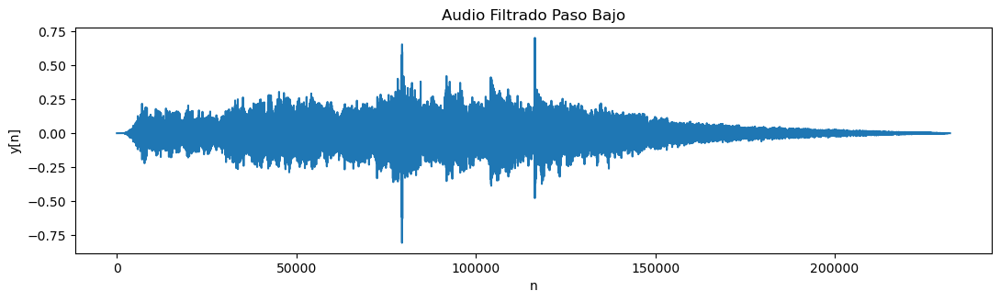

In [48]:
out_Palto = np.convolve(audio_in, h_alto, mode='same') #Convolución entre el audio y h_alto

# Graficar la señal de entrada
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(audio_in)
plt.ylabel('x[n]')
plt.title('Audio Original')

# Graficar la señal filtrada
plt.figure(figsize=(11, 6))
plt.subplot(2, 1, 2)
plt.plot(out_Palto)
plt.title('Audio Filtrado Paso Bajo')
plt.xlabel('n')
plt.ylabel('y[n]')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Frecuencias de la Señal de Audio Filtrada (Paso Alto)')

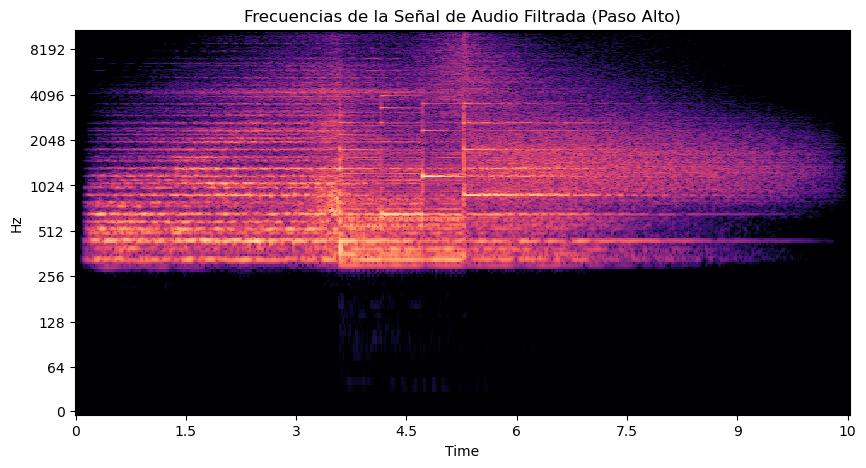

In [49]:
# Graficar el espectro de frecuencias de la señal de audio resultante
TF_alto = librosa.stft(out_Palto)
Amp_alto_db = librosa.amplitude_to_db(abs(TF_alto), ref=np.max)

fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(Amp_alto_db, x_axis='time', y_axis='log', ax=ax)
plt.title('Frecuencias de la Señal de Audio Filtrada (Paso Alto)')

In [50]:
ipd.Audio(out_Palto, rate=sr) #Reproducir el audio resultante